<a href="https://colab.research.google.com/github/jessicayeh35/MATH-42---FALL-2024/blob/main/Math42_Final_Project_ipynb.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Import necessary libraries
import pandas as pd
import numpy as np
from scipy.stats import uniform
from scipy.stats import norm
import matplotlib.pyplot as plt
import math

## To Do

---


- fine tune the parameters
- change the proposal to match the parameters
- box plot
  


## Code

### Main Code

Trial 1: Dragon 2 dies at time step 3
Trial 1: Dragon 3 dies at time step 3
Trial 1: Dragon 1 dies at time step 886
Trial 2: Dragon 3 dies at time step 71
Trial 2: Dragon 1 dies at time step 383
Trial 3: Dragon 3 dies at time step 7
Trial 4: Dragon 1 dies at time step 26
Trial 4: Dragon 3 dies at time step 218
Trial 5: Dragon 3 dies at time step 68
Trial 5: Dragon 1 dies at time step 130
Trial 6: Dragon 1 dies at time step 5
Trial 6: Dragon 3 dies at time step 28
Trial 7: Dragon 3 dies at time step 79
Trial 8: Dragon 3 dies at time step 19
Trial 8: Dragon 1 dies at time step 22
Trial 9: Dragon 3 dies at time step 55
Trial 9: Dragon 1 dies at time step 607
Trial 10: Dragon 3 dies at time step 51
Trial 11: Dragon 1 dies at time step 9
Trial 11: Dragon 3 dies at time step 272
Trial 12: Dragon 3 dies at time step 26
Trial 12: Dragon 1 dies at time step 459
Trial 13: Dragon 1 dies at time step 98
Trial 13: Dragon 3 dies at time step 308
Trial 14: Dragon 3 dies at time step 46
Trial 14: Drag

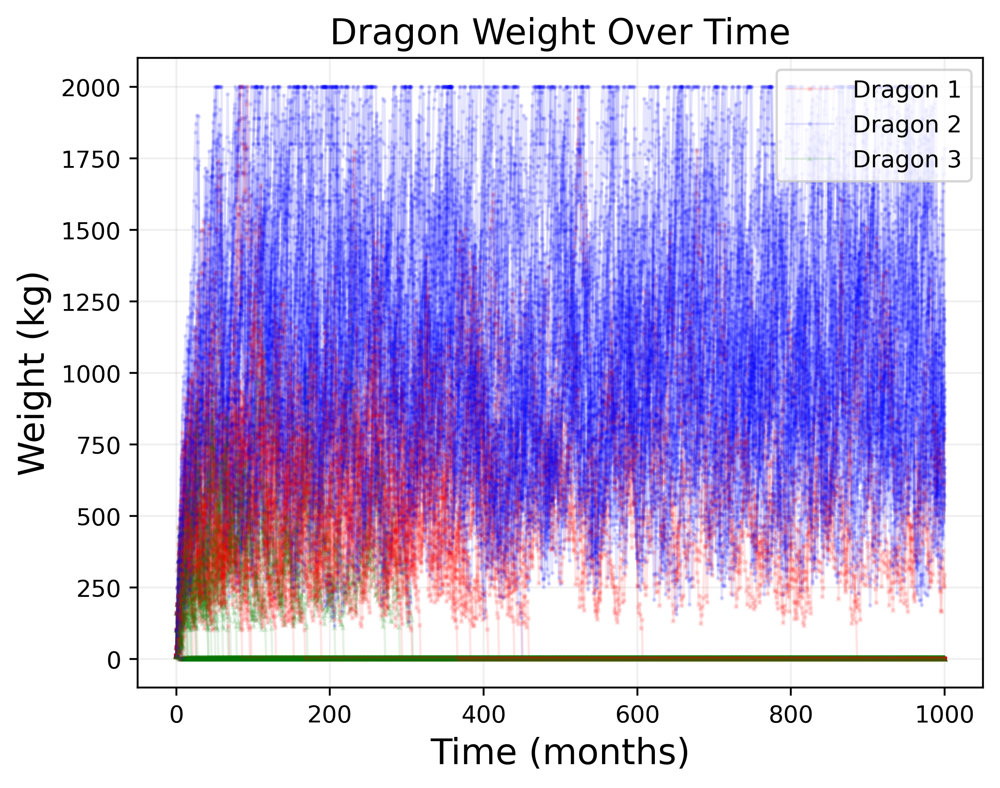

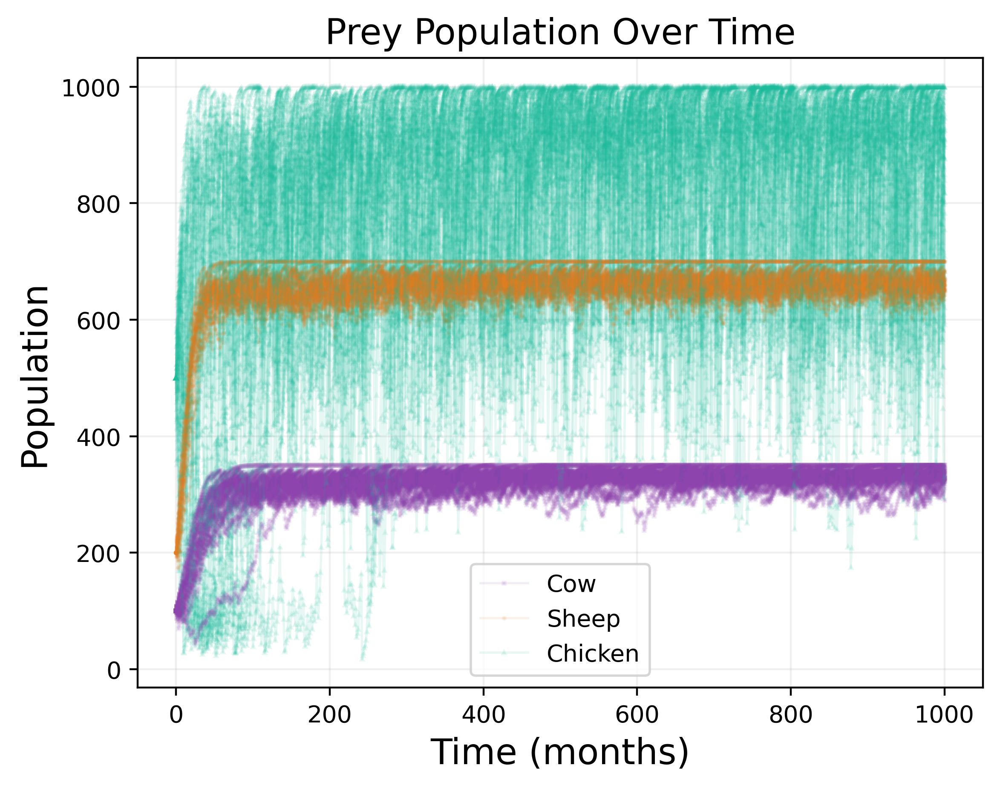

In [ ]:
# Set-up for simulation

N_trials = 30         # Number of simulation trials
N_month = 1001         # Number of months to track population

K = 2000              # Maximum weight for all dragons
T = 5000              # Weight below which the dragons will die
W0 = 10               # Initial weight (same for all dragons)
death_threshold = 100  # Weight below which the dragon will die (original 10)

# Cow
initial_pop_cow = 100           # Initial cow population
growth_rate_cow = .10           # Average cow growth rate
growth_rate_cow_sd = .01        # Cow growth rate Standard deviation
kg_from_cow = 150               # Kg gained from eating cows
T_cow = 15                      # Cow population below which dragons lose 10% of its weight if it tries to hunt cows
cows_lost = 10                  # Cow population lost due to hunting
K_cow = 350                     # Maximum population for cows

# Sheep
initial_pop_sheep = 200         # Initial sheep population
growth_rate_sheep = .15         # Average sheep growth rate
growth_rate_sheep_sd = .05      # Sheep growth rate Standard deviation
kg_from_sheep = 90              # Kg gained from eating sheep
T_sheep = 50                    # Sheep population below which dragons lose 10% of its weight if it tries to hunt sheep
sheep_lost = 15                 # Sheep population lost due to hunting
K_sheep = 700                   # Maximum population for sheep

# Chickens
initial_pop_chick = 500         # Initial chicken population
growth_rate_chick = .30         # Average chicken growth rate
growth_rate_chick_sd = .10      # Chicken growth rate Standard deviation
kg_from_chick = 30              # Kg gained from eating chickens
T_chick = 100                   # Chicken population below which dragons lose 10% of its weight if it tries to hunt chickens
chickens_lost = 75              # Chicken population lost due to hunting
K_chick = 1000                  # Maximum population for chickens

# Initialize three empty DataFrames to store the results of all trials for each dragon
df_A = pd.DataFrame()
df_B = pd.DataFrame()
df_C = pd.DataFrame()

# Initialize three empty DataFrames to store the results of all trials for each prey
df_X = pd.DataFrame()
df_Y = pd.DataFrame()
df_Z = pd.DataFrame()

# Main loop for simulation
for i in range(N_trials):
    passed_threshold_A = False
    passed_threshold_B = False
    passed_threshold_C = False

    alive_A = True  # Dragon 1 is initially alive
    alive_B = True  # Dragon 2 is initially alive
    alive_C = True  # Dragon 3 is initially alive
    # Initialize vectors to record weight for each dragon
    A = np.zeros(N_month)
    B = np.zeros(N_month)
    C = np.zeros(N_month)

    # Initialize vectors to record population for each prey
    X = np.zeros(N_month)
    Y = np.zeros(N_month)
    Z = np.zeros(N_month)

    A[0] = W0  # Set initial weight
    B[0] = W0  # Set initial weight
    C[0] = W0  # Set initial weight

    X[0] = initial_pop_cow    # Set initial population size
    Y[0] = initial_pop_sheep  # Set initial population size
    Z[0] = initial_pop_chick  # Set initial population size

    # Looping over months
    for j in range(1, N_month):

        # Dem Stoch
        # Get stochastic growth rate for prey
        x = norm.rvs(loc=growth_rate_cow, scale=growth_rate_cow_sd)
        y = norm.rvs(loc=growth_rate_sheep, scale=growth_rate_sheep_sd)
        z = norm.rvs(loc=growth_rate_chick, scale=growth_rate_chick_sd)

        # Cow
        X[j] = X[j-1] + (1-X[j-1]/K_cow)*x*X[j-1]

        # Sheep
        Y[j] = Y[j-1] + (1-Y[j-1]/K_sheep)*y*Y[j-1]

        # Chicken
        Z[j] = Z[j-1] + (1-Z[j-1]/K_chick)*z*Z[j-1]

        # Env Stoch
        # Uniformly distributed random value
        a = uniform.rvs()
        b = uniform.rvs()
        c = uniform.rvs()

        # Update weight growth rate based on ability to hunt
        # Dragon 1
        if alive_A:
            if a < .60:
                a0 = uniform.rvs()
                if a0 < 0.30:  # Cow
                    if X[j-1] < T_cow:
                        A[j] = A[j-1] - (.10)*A[j-1]
                    else:
                        A[j] = A[j-1] + kg_from_cow
                        X[j] -= cows_lost
                elif a0 < (0.30 + 0.20):  # Sheep
                    if Y[j-1] < T_sheep:
                        A[j] = A[j-1] - (.10)*A[j-1]
                    else:
                        A[j] = A[j-1] + kg_from_sheep
                        Y[j] -= sheep_lost
                else:  # Chicken
                    if Z[j-1] < T_chick:
                        A[j] = A[j-1] - (.10)*A[j-1]
                    else:
                        A[j] = A[j-1] + kg_from_chick
                        Z[j] -= chickens_lost
            else:
                a0 = uniform.rvs()
                if a0 < 0.30:  # Cow
                  A[j] = A[j-1] - (.30)*A[j-1]
                elif a0 < (0.30 + 0.20):  # Sheep
                  A[j] = A[j-1] - (.20)*A[j-1]
                else:  # Chicken
                  A[j] = A[j-1] - (.10)*A[j-1]

        # Cap weight at K
        if A[j] > K:
            A[j] = K

        # Dragon 2
        if alive_B:
            if b < .70:
                b0 = uniform.rvs()
                if b0 < 0.25:  # Cow
                    if X[j] < T_cow:
                        B[j] = B[j-1] - (.10)*B[j-1]
                    else:
                        B[j] = B[j-1] + kg_from_cow
                        X[j] -= cows_lost
                elif b0 < (0.25 + 0.50):  # Sheep
                    if Y[j] < T_sheep:
                        B[j] = B[j-1] - (.10)*B[j-1]
                    else:
                        B[j] = B[j-1] + kg_from_sheep
                        Y[j] -= sheep_lost
                else:  # Chicken
                    if Z[j] < T_chick:
                        B[j] = B[j-1] - (.10)*B[j-1]
                    else:
                        B[j] = B[j-1] + kg_from_chick
                        Z[j] -= chickens_lost
            else:
                b0 = uniform.rvs()
                if b0 < 0.30:  # Cow
                  B[j] = B[j-1] - (.30)*B[j-1]
                elif b0 < (0.30 + 0.20):  # Sheep
                  B[j] = B[j-1] - (.20)*B[j-1]
                else:  # Chicken
                  B[j] = B[j-1] - (.10)*B[j-1]

        # Cap weight at K
        if B[j] > K:
            B[j] = K

        # Dragon 3
        if alive_C:
            if b < .50:
                c0 = uniform.rvs()
                if c0 < 0.20:  # Cow
                    if X[j] < T_cow:
                        C[j] = C[j-1] - (.10)*C[j-1]
                    else:
                        C[j] = C[j-1] + kg_from_cow
                        X[j] -= cows_lost
                elif c0 < (0.20 + 0.30):  # Sheep
                    if Y[j] < T_sheep:
                        C[j] = C[j-1] - (.10)*C[j-1]
                    else:
                        C[j] = C[j-1] + kg_from_sheep
                        Y[j] -= sheep_lost
                else:  # Chicken
                    if Z[j] < T_chick:
                        C[j] = C[j-1] - (.10)*C[j-1]
                    else:
                        C[j] = C[j-1] + kg_from_chick
                        Z[j] -= chickens_lost
            else:
                c0 = uniform.rvs()
                if c0 < 0.30:  # Cow
                  C[j] = C[j-1] - (.30)*C[j-1]
                elif c0 < (0.30 + 0.20):  # Sheep
                  C[j] = C[j-1] - (.20)*C[j-1]
                else:  # Chicken
                  C[j] = C[j-1] - (.10)*C[j-1]

        # Cap weight at K
        if C[j] > K:
            C[j] = K

        # Carrying capacity for prey
        if X[j] > K_cow:
            X[j] = K_cow

        if Y[j] > K_sheep:
            Y[j] = K_sheep

        if Z[j] > K_chick:
            Z[j] = K_chick

        #Hunter
        e1 = uniform.rvs()
        if j % 30 == 0:
            if e1 < 0.01:
                A[j] *= .60
                B[j] *= .60
                C[j] *= .60
            elif e1 < (0.01+0.30):
                A[j] *= .80
                B[j] *= .80
                C[j] *= .80
            else:
                A[j] *= .90
                B[j] *= .90
                C[j] *= .90

        # Drought
        e2 = uniform.rvs()
        if e2 < 0.05:
            Z[j] *= .60

        # Once dragons pass the death threshold, they are eligible to die
        if A[j] > death_threshold:
            passed_threshold_A = True

        if B[j] > death_threshold:
            passed_threshold_B = True

        if C[j] > death_threshold:
            passed_threshold_C = True

        # Check if Dragon 1 dies
        if alive_A and passed_threshold_A:
            if A[j] < death_threshold:
                A[j] = 0  # Dragon dies, set weight to 0
                alive_A = False
                print(f"Trial {i+1}: Dragon 1 dies at time step {j}")

        # Check if Dragon 2 dies
        if alive_B and passed_threshold_B:
            if B[j] < death_threshold:
                B[j] = 0  # Dragon dies, set weight to 0
                alive_B = False
                print(f"Trial {i+1}: Dragon 2 dies at time step {j}")

        # Check if Dragon 3 dies
        if alive_C and passed_threshold_C:
            if C[j] < death_threshold:
                C[j] = 0  # Dragon dies, set weight to 0
                alive_C = False
                print(f"Trial {i+1}: Dragon 3 dies at time step {j}")

    # Augment the result of a trial to the DataFrame
    temp_A = pd.DataFrame(A, columns=[f"Trial {i+1}"])
    df_A = pd.concat([df_A, temp_A], axis=1)

    temp_B = pd.DataFrame(B, columns=[f"Trial {i+1}"])
    df_B = pd.concat([df_B, temp_B], axis=1)

    temp_C = pd.DataFrame(C, columns=[f"Trial {i+1}"])
    df_C = pd.concat([df_C, temp_C], axis=1)

    temp_X = pd.DataFrame(X, columns=[f"Trial {i+1}"])
    df_X = pd.concat([df_X, temp_X], axis=1)

    temp_Y = pd.DataFrame(Y, columns=[f"Trial {i+1}"])
    df_Y = pd.concat([df_Y, temp_Y], axis=1)

    temp_Z = pd.DataFrame(Z, columns=[f"Trial {i+1}"])
    df_Z = pd.concat([df_Z, temp_Z], axis=1)

# Plot I: Plot random trajectories over time for Dragon Weight
fig, ax = plt.subplots(1, 1, dpi=400)

for i in range(N_trials):
    ax.plot(df_A[f"Trial {i+1}"], "-s", linewidth=1, markersize=1, label = 'Dragon 1', color='r',alpha=0.1)
    ax.plot(df_B[f"Trial {i+1}"], "-o", linewidth=1, markersize=1, label = 'Dragon 2', color='b', alpha=0.1)
    ax.plot(df_C[f"Trial {i+1}"], "-^", linewidth=1, markersize=1, label = 'Dragon 3',color='g', alpha=0.1)

ax.set_xlabel("Time (months)", fontsize=15)
ax.set_ylabel("Weight (kg)", fontsize=15)
plt.grid(visible=True, alpha=0.2)
plt.legend(['Dragon 1', 'Dragon 2', 'Dragon 3'])
plt.title("Dragon Weight Over Time", fontsize=15)
plt.show()

# Plot II: Plot random trajectories over time for Prey Population
fig, ax = plt.subplots(1, 1, dpi=400)

for i in range(N_trials):
    ax.plot(df_X[f"Trial {i+1}"], "-s", linewidth=1, markersize=1, label = 'Cow', color='#8E44AD', alpha=0.1)
    ax.plot(df_Y[f"Trial {i+1}"], "-o", linewidth=1, markersize=1, label = 'Sheep', color='#E67E22', alpha=0.1)
    ax.plot(df_Z[f"Trial {i+1}"],  "-^", linewidth=1, markersize=1, label = 'Chicken', color='#1ABC9C', alpha=0.1)

ax.set_xlabel("Time (months)", fontsize=15)
ax.set_ylabel("Population", fontsize=15)
plt.grid(visible=True, alpha=0.2)
plt.legend(['Cow', 'Sheep', 'Chicken'])
plt.title("Prey Population Over Time", fontsize=15)
plt.show()

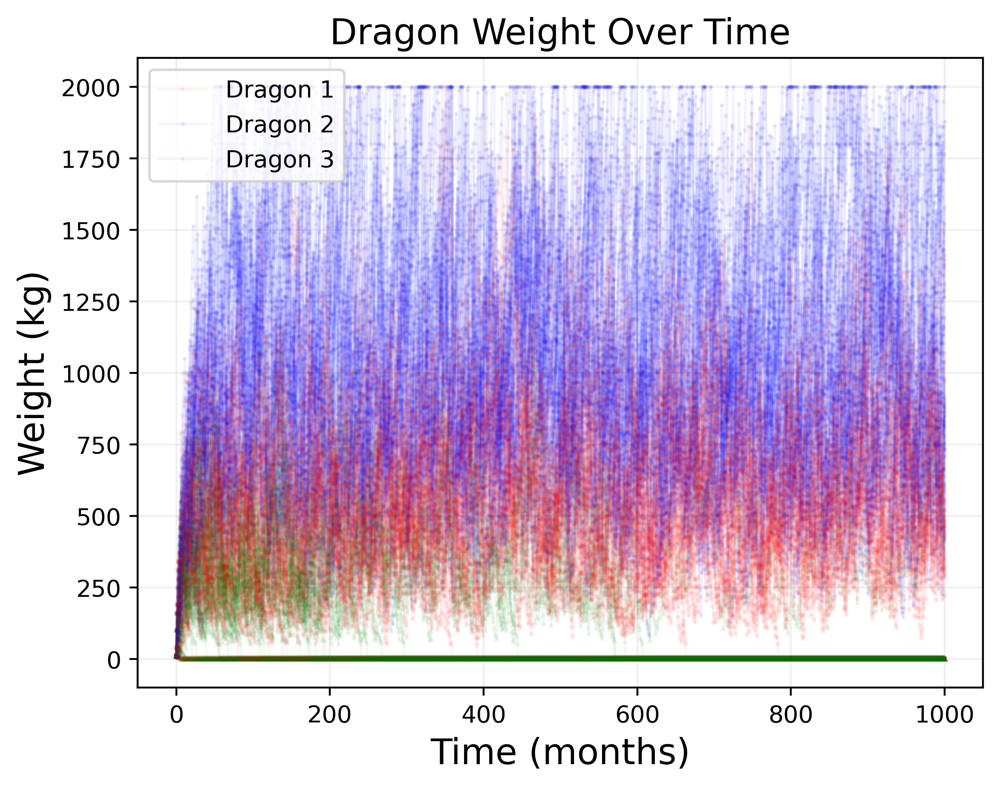

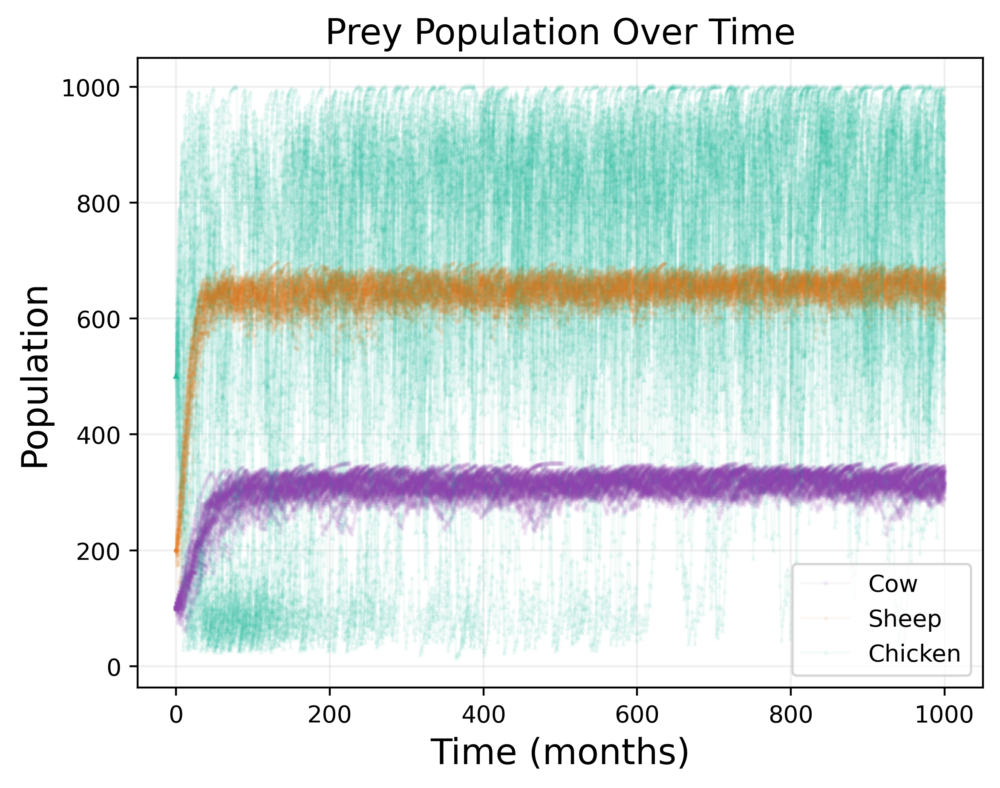

In [ ]:
# Plot I: Plot random trajectories over time for Dragon Weight
fig, ax = plt.subplots(1, 1, dpi=400)

for i in range(N_trials):
    ax.plot(df_A[f"Trial {i+1}"], "-s", linewidth=1, markersize=1, label = 'Dragon 1', color='r', alpha=0.05)
    ax.plot(df_B[f"Trial {i+1}"], "-o", linewidth=1, markersize=1, label = 'Dragon 2', color='b', alpha=0.05)
    ax.plot(df_C[f"Trial {i+1}"], "-^", linewidth=1, markersize=1, label = 'Dragon 3',color='g', alpha=0.05)

ax.set_xlabel("Time (months)", fontsize=15)
ax.set_ylabel("Weight (kg)", fontsize=15)
plt.grid(visible=True, alpha=0.2)
plt.legend(['Dragon 1', 'Dragon 2', 'Dragon 3'])
plt.title("Dragon Weight Over Time", fontsize=15)
plt.show()

# Plot II: Plot random trajectories over time for Prey Population
fig, ax = plt.subplots(1, 1, dpi=400)

for i in range(N_trials):
    ax.plot(df_X[f"Trial {i+1}"], "-s", linewidth=1, markersize=1, label = 'Cow', color='#8E44AD', alpha=0.05)
    ax.plot(df_Y[f"Trial {i+1}"], "-o", linewidth=1, markersize=1, label = 'Sheep', color='#E67E22', alpha=0.05)
    ax.plot(df_Z[f"Trial {i+1}"],  "-^", linewidth=1, markersize=1, label = 'Chicken', color='#1ABC9C', alpha=0.05)

ax.set_xlabel("Time (months)", fontsize=15)
ax.set_ylabel("Population", fontsize=15)
plt.grid(visible=True, alpha=0.2)
plt.legend(['Cow', 'Sheep', 'Chicken'])
plt.title("Prey Population Over Time", fontsize=15)
plt.show()

### Averages

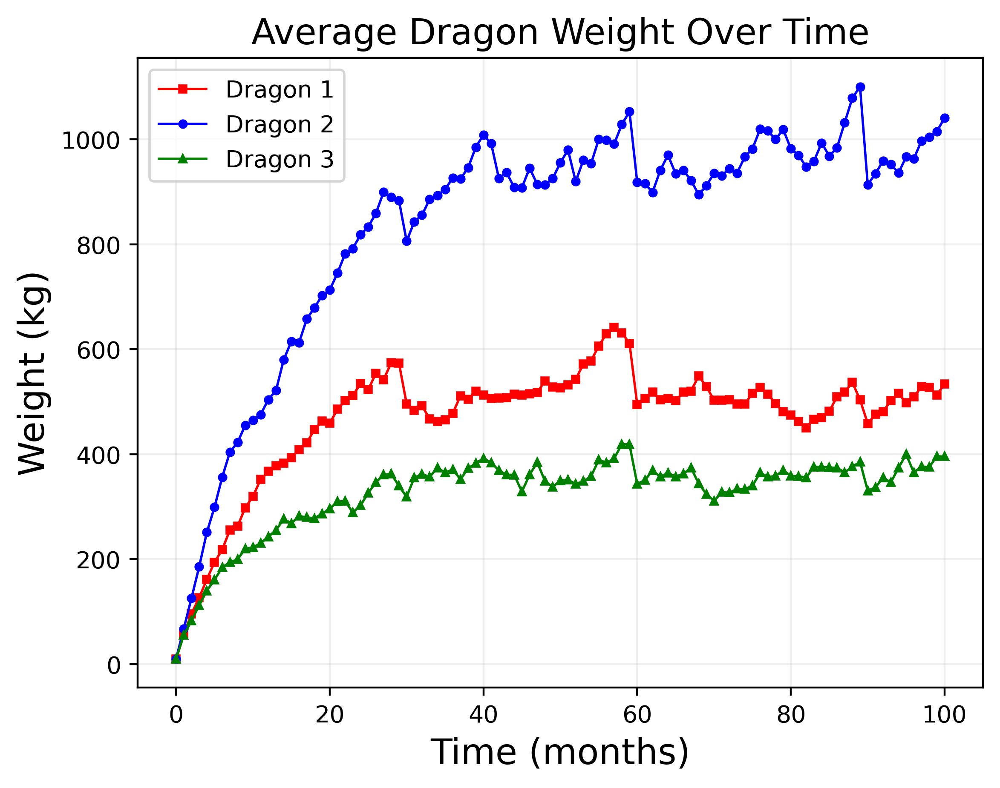

In [ ]:
# AVERAGES FOR DRAGONS
averages = []
for row in range(N_month):
  averages.append(np.mean(df_A.iloc[row].values))
df_A["Average"] = averages
averages = []
for row in range(N_month):
  averages.append(np.mean(df_B.iloc[row].values))
df_B["Average"] = averages
averages = []
for row in range(N_month):
  averages.append(np.mean(df_C.iloc[row].values))
df_C["Average"] = averages

fig, ax = plt.subplots(1, 1, dpi=400)
ax.plot(df_A["Average"], "-s", linewidth=1, markersize=3, label = 'Dragon 1', color='r')
ax.plot(df_B["Average"], "-o", linewidth=1, markersize=3, label = 'Dragon 2', color='b')
ax.plot(df_C["Average"], "-^", linewidth=1, markersize=3, label = 'Dragon 3',color='g')

ax.set_xlabel("Time (months)", fontsize=15)
ax.set_ylabel("Weight (kg)", fontsize=15)
plt.grid(visible=True, alpha=0.2)
plt.legend(['Dragon 1', 'Dragon 2', 'Dragon 3'])
plt.title("Average Dragon Weight Over Time", fontsize=15)
plt.show()

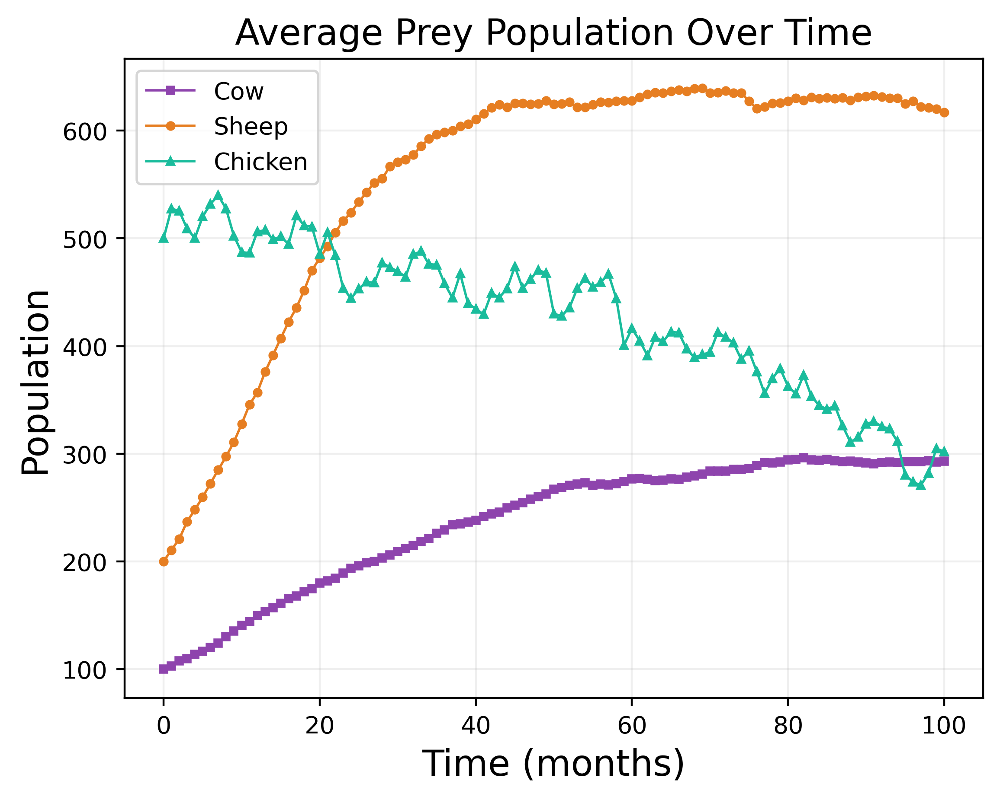

In [ ]:
# AVERAGES FOR PREY
averages = []
for row in range(N_month):
  averages.append(np.mean(df_X.iloc[row].values))
df_X["Average"] = averages
averages = []
for row in range(N_month):
  averages.append(np.mean(df_Y.iloc[row].values))
df_Y["Average"] = averages
averages = []
for row in range(N_month):
  averages.append(np.mean(df_Z.iloc[row].values))
df_Z["Average"] = averages

fig, ax = plt.subplots(1, 1, dpi=400)

ax.plot(df_X["Average"], "-s", linewidth=1, markersize=3, label = 'Cow', color='#8E44AD')
ax.plot(df_Y["Average"], "-o", linewidth=1, markersize=3, label = 'Sheep', color='#E67E22')
ax.plot(df_Z["Average"], "-^", linewidth=1, markersize=3, label = 'Chicken', color='#1ABC9C')

ax.set_xlabel("Time (months)", fontsize=15)
ax.set_ylabel("Population", fontsize=15)
plt.grid(visible=True, alpha=0.2)
plt.legend(['Cow', 'Sheep', 'Chicken'])
plt.title("Average Prey Population Over Time", fontsize=15)
plt.show()

### Overlayed Graph

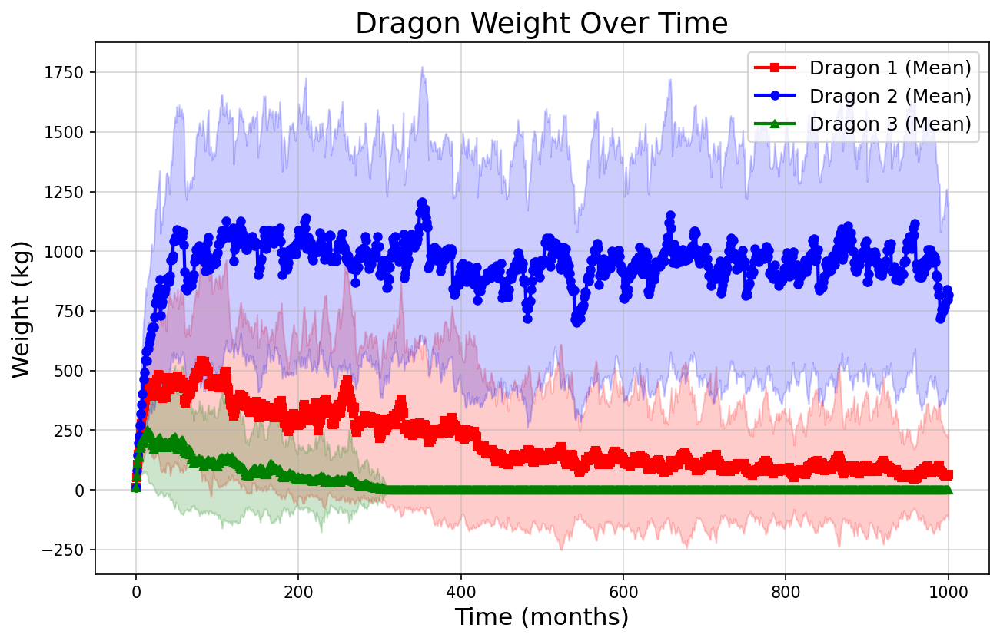

In [ ]:
# Overlayed Graph for Dragon Weight Over Time

fig, ax = plt.subplots(1, 1, dpi=150, figsize=(10, 6))

# mean trajectory and confidence intervals for Dragon Weight
mean_A = df_A.mean(axis=1)
std_A = df_A.std(axis=1)
ax.plot(mean_A, "-s", linewidth=2, markersize=5, label="Dragon 1 (Mean)", color='r')
ax.fill_between(range(N_month), mean_A - std_A, mean_A + std_A, color='r', alpha=0.2)

mean_B = df_B.mean(axis=1)
std_B = df_B.std(axis=1)
ax.plot(mean_B, "-o", linewidth=2, markersize=5, label="Dragon 2 (Mean)", color='b')
ax.fill_between(range(N_month), mean_B - std_B, mean_B + std_B, color='b', alpha=0.2)

mean_C = df_C.mean(axis=1)
std_C = df_C.std(axis=1)
ax.plot(mean_C, "-^", linewidth=2, markersize=5, label="Dragon 3 (Mean)", color='g')
ax.fill_between(range(N_month), mean_C - std_C, mean_C + std_C, color='g', alpha=0.2)

# Labels
ax.set_xlabel("Time (months)", fontsize=15)
ax.set_ylabel("Weight (kg)", fontsize=15)
ax.grid(visible=True, alpha=0.5)
ax.set_title("Dragon Weight Over Time", fontsize=18)
ax.legend(fontsize=12)
plt.show()

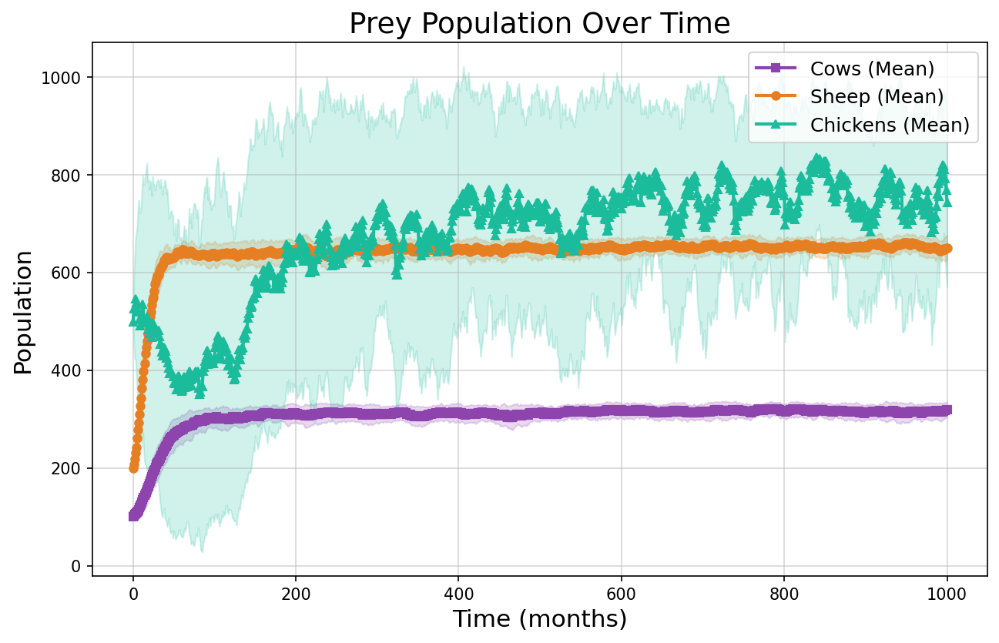

In [ ]:
# Plot II: Prey Population Over Time
fig, ax = plt.subplots(1, 1, dpi=150, figsize=(10, 6))

# Plot mean trajectory and confidence intervals for Prey Population
mean_X = df_X.mean(axis=1)
std_X = df_X.std(axis=1)
ax.plot(mean_X, "-s", linewidth=2, markersize=5, label="Cows (Mean)", color='#8E44AD')
ax.fill_between(range(N_month), mean_X - std_X, mean_X + std_X, color='#8E44AD', alpha=0.2)

mean_Y = df_Y.mean(axis=1)
std_Y = df_Y.std(axis=1)
ax.plot(mean_Y, "-o", linewidth=2, markersize=5, label="Sheep (Mean)", color='#E67E22')
ax.fill_between(range(N_month), mean_Y - std_Y, mean_Y + std_Y, color='#E67E22', alpha=0.2)

mean_Z = df_Z.mean(axis=1)
std_Z = df_Z.std(axis=1)
ax.plot(mean_Z, "-^", linewidth=2, markersize=5, label="Chickens (Mean)", color='#1ABC9C')
ax.fill_between(range(N_month), mean_Z - std_Z, mean_Z + std_Z, color='#1ABC9C', alpha=0.2)

# Enhance visual appearance
ax.set_xlabel("Time (months)", fontsize=15)
ax.set_ylabel("Population", fontsize=15)
ax.grid(visible=True, alpha=0.5)
ax.set_title("Prey Population Over Time", fontsize=18)
ax.legend(fontsize=12)
plt.show()


### Boxplot

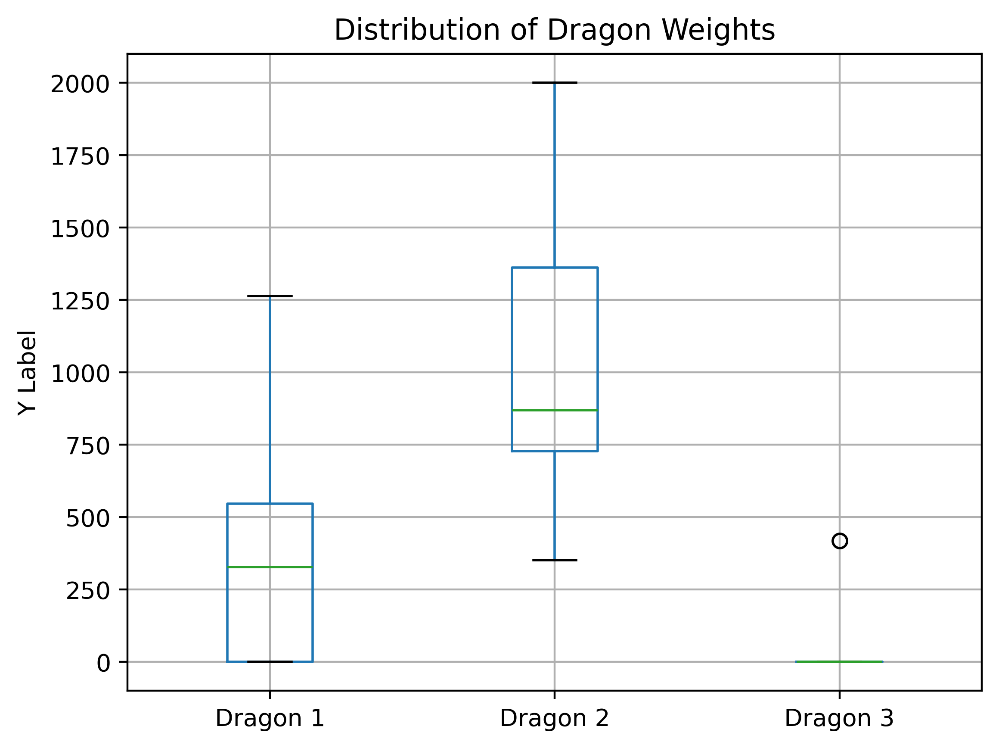

In [ ]:
dataA = np.array(df_A.iloc[-1].values)
dataB = np.array(df_B.iloc[-1].values)
dataC = np.array(df_C.iloc[-1].values)
boxdf = pd.DataFrame({"Dragon 1": dataA, "Dragon 2": dataB, "Dragon 3": dataC})

fig, ax = plt.subplots(1, 1, dpi=400)

boxdf.boxplot(column=['Dragon 1', 'Dragon 2', 'Dragon 3'], ax = ax)
ax.set_ylabel('Y Label')
ax.set_title('Distribution of Dragon Weights')
plt.show()

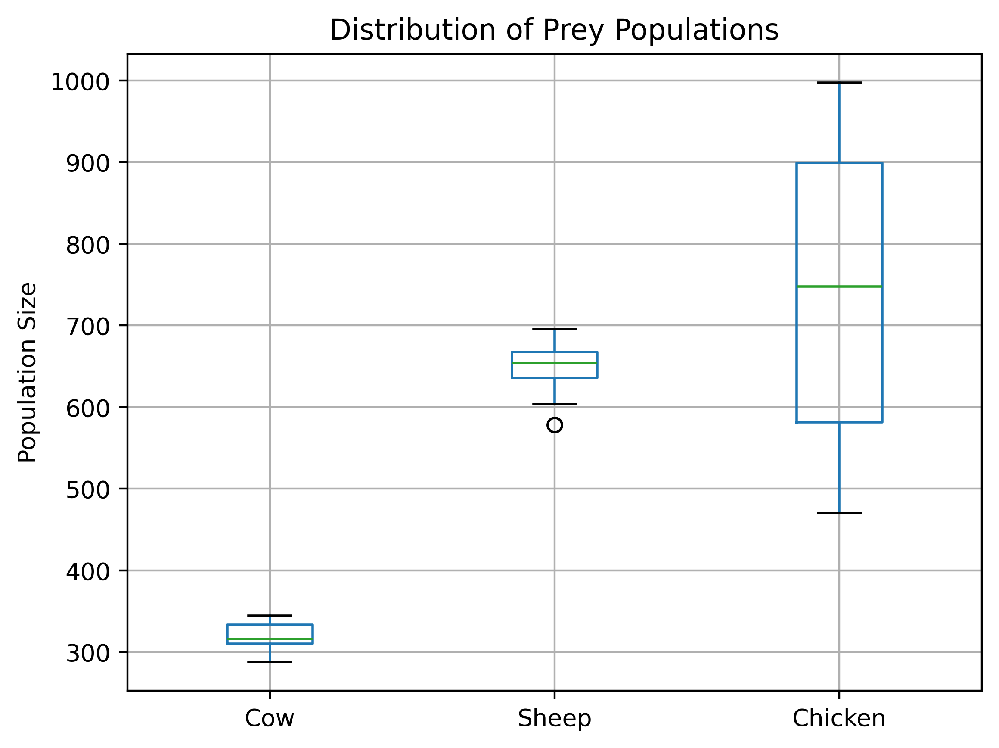

In [ ]:
dataX = np.array(df_X.iloc[-1].values)
dataY = np.array(df_Y.iloc[-1].values)
dataZ = np.array(df_Z.iloc[-1].values)
boxdf_prey = pd.DataFrame({"Cow": dataX, "Sheep": dataY, "Chicken": dataZ})

fig, ax = plt.subplots(1, 1, dpi=400)

boxdf_prey.boxplot(column=['Cow', 'Sheep', 'Chicken'], ax = ax)
ax.set_ylabel('Population Size')
ax.set_title('Distribution of Prey Populations')
plt.show()



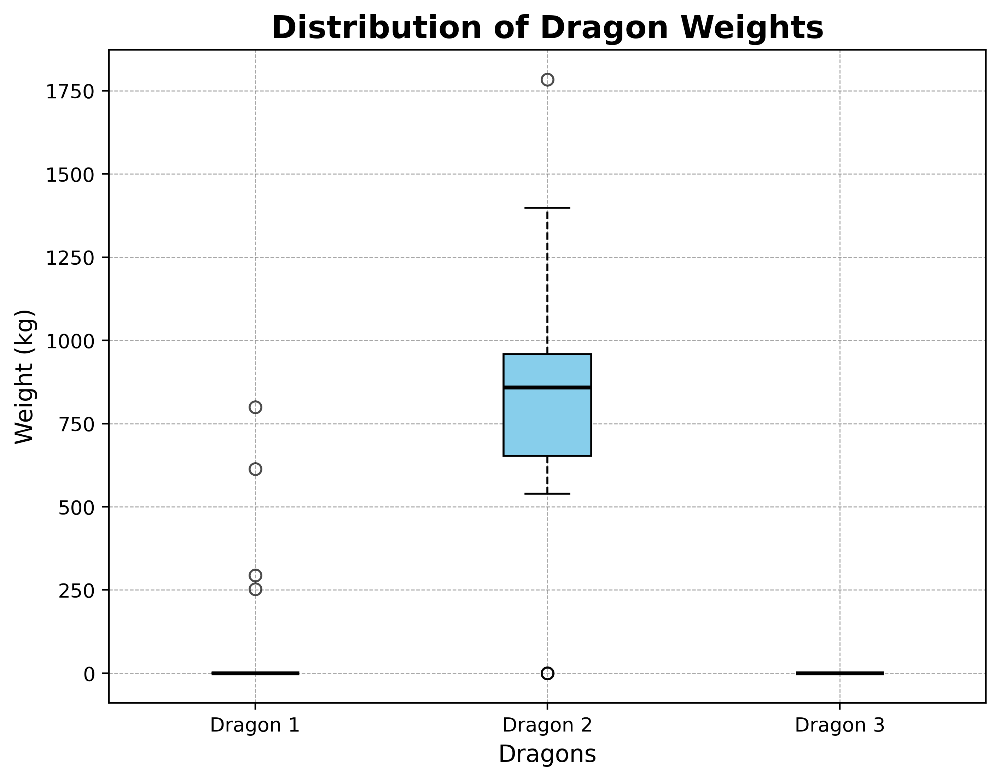

In [ ]:
## Formatted BoxPlot for Dragon Weights

dataA = np.array(df_A.iloc[-1].values)
dataB = np.array(df_B.iloc[-1].values)
dataC = np.array(df_C.iloc[-1].values)
boxdf = pd.DataFrame({"Dragon 1": dataA, "Dragon 2": dataB, "Dragon 3": dataC})

fig, ax = plt.subplots(1, 1, dpi=400, figsize=(8, 6))

colors = ['salmon', 'skyblue', 'lightgreen']
boxplots = ax.boxplot([boxdf['Dragon 1'], boxdf['Dragon 2'], boxdf['Dragon 3']],
                      patch_artist=True,
                      labels=['Dragon 1', 'Dragon 2', 'Dragon 3'])

for box, color in zip(boxplots['boxes'], colors):
    box.set(facecolor=color)

ax.grid(color='gray', linestyle='--', linewidth=0.5, alpha=0.7)
ax.set_title('Distribution of Dragon Weights', fontsize=16, fontweight='bold')
ax.set_ylabel('Weight (kg)', fontsize=12)
ax.set_xlabel('Dragons', fontsize=12)
ax.tick_params(axis='x', labelsize=10)
ax.tick_params(axis='y', labelsize=10)

# formatting the actual boxplots
for median in boxplots['medians']:
    median.set(color='black', linewidth=2)

for whisker in boxplots['whiskers']:
    whisker.set(color='black', linestyle='--')
for cap in boxplots['caps']:
    cap.set(color='black')

for flier in boxplots['fliers']:
    flier.set(marker='o', color='orange', alpha=0.7)

plt.show()


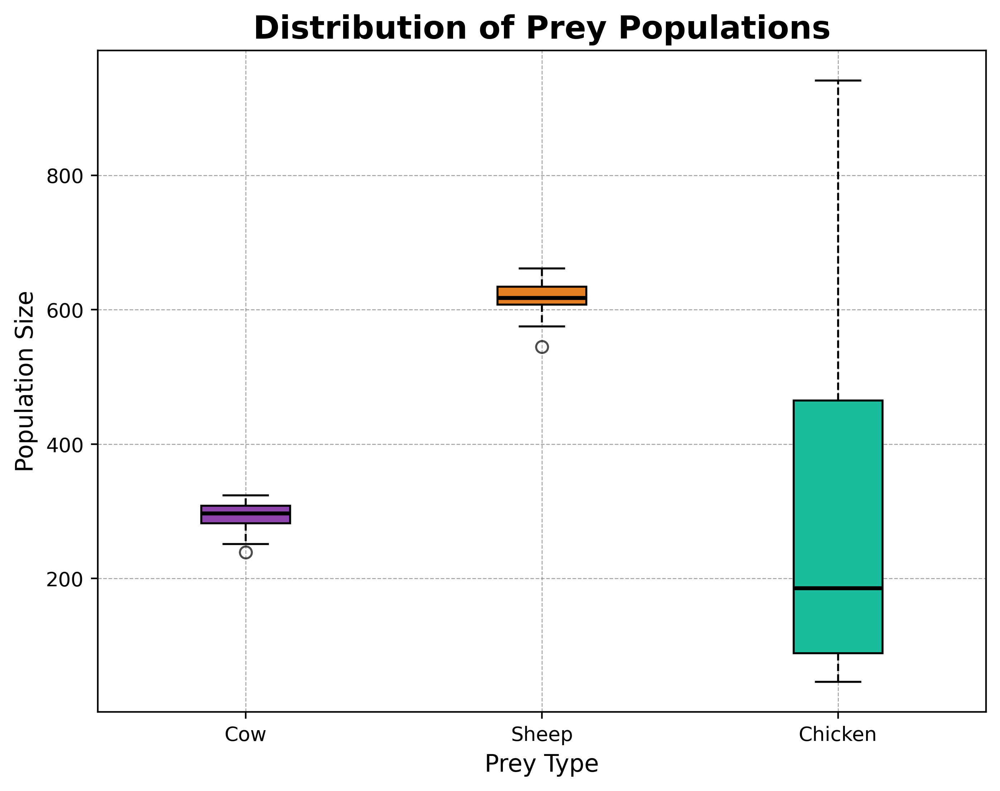

In [ ]:
# formatted boxplot for prey

dataX = np.array(df_X.iloc[-1].values)
dataY = np.array(df_Y.iloc[-1].values)
dataZ = np.array(df_Z.iloc[-1].values)
boxdf_prey = pd.DataFrame({"Cow": dataX, "Sheep": dataY, "Chicken": dataZ})

fig, ax = plt.subplots(1, 1, dpi=400, figsize=(8, 6))

colors = ['#8E44AD', '#E67E22', '#1ABC9C']
boxplots = ax.boxplot([boxdf_prey['Cow'], boxdf_prey['Sheep'], boxdf_prey['Chicken']],
                      patch_artist=True,
                      labels=['Cow', 'Sheep', 'Chicken'])


for box, color in zip(boxplots['boxes'], colors):
    box.set(facecolor=color)

# Labels
ax.grid(color='gray', linestyle='--', linewidth=0.5, alpha=0.7)
ax.set_title('Distribution of Prey Populations', fontsize=16, fontweight='bold')
ax.set_ylabel('Population Size', fontsize=12)
ax.set_xlabel('Prey Type', fontsize=12)
ax.tick_params(axis='x', labelsize=10)
ax.tick_params(axis='y', labelsize=10)

# formatting the actual boxplot
for median in boxplots['medians']:
    median.set(color='black', linewidth=2)

for whisker in boxplots['whiskers']:
    whisker.set(color='black', linestyle='--')
for cap in boxplots['caps']:
    cap.set(color='black')

for flier in boxplots['fliers']:
    flier.set(marker='o', color='orange', alpha=0.7)

plt.show()


### Deterministic

Trial 1: Dragon 1 dies at time step 38
Trial 2: Dragon 1 dies at time step 38
Trial 3: Dragon 1 dies at time step 38
Trial 4: Dragon 1 dies at time step 38
Trial 5: Dragon 1 dies at time step 38
Trial 6: Dragon 1 dies at time step 38
Trial 7: Dragon 1 dies at time step 38
Trial 8: Dragon 1 dies at time step 38
Trial 9: Dragon 1 dies at time step 38
Trial 10: Dragon 1 dies at time step 38
Trial 11: Dragon 1 dies at time step 38
Trial 12: Dragon 1 dies at time step 38
Trial 13: Dragon 1 dies at time step 38
Trial 14: Dragon 1 dies at time step 38
Trial 15: Dragon 1 dies at time step 38
Trial 16: Dragon 1 dies at time step 38
Trial 17: Dragon 1 dies at time step 38
Trial 18: Dragon 1 dies at time step 38
Trial 19: Dragon 1 dies at time step 38
Trial 20: Dragon 1 dies at time step 38
Trial 21: Dragon 1 dies at time step 38
Trial 22: Dragon 1 dies at time step 38
Trial 23: Dragon 1 dies at time step 38
Trial 24: Dragon 1 dies at time step 38
Trial 25: Dragon 1 dies at time step 38
Trial 26:

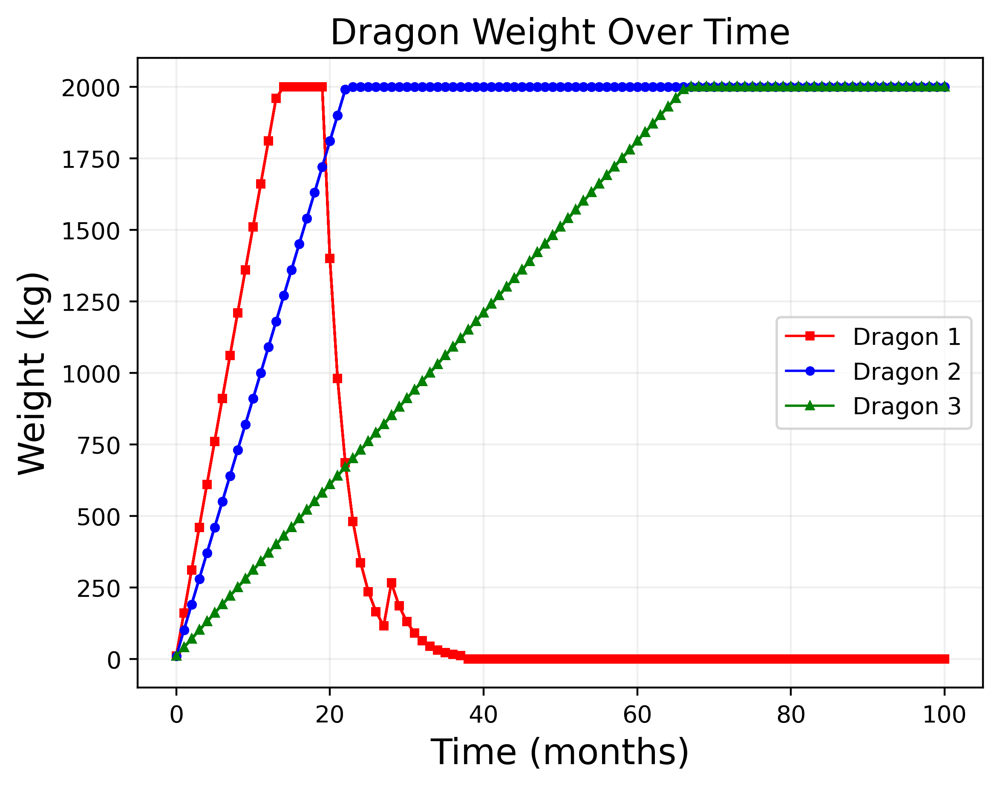

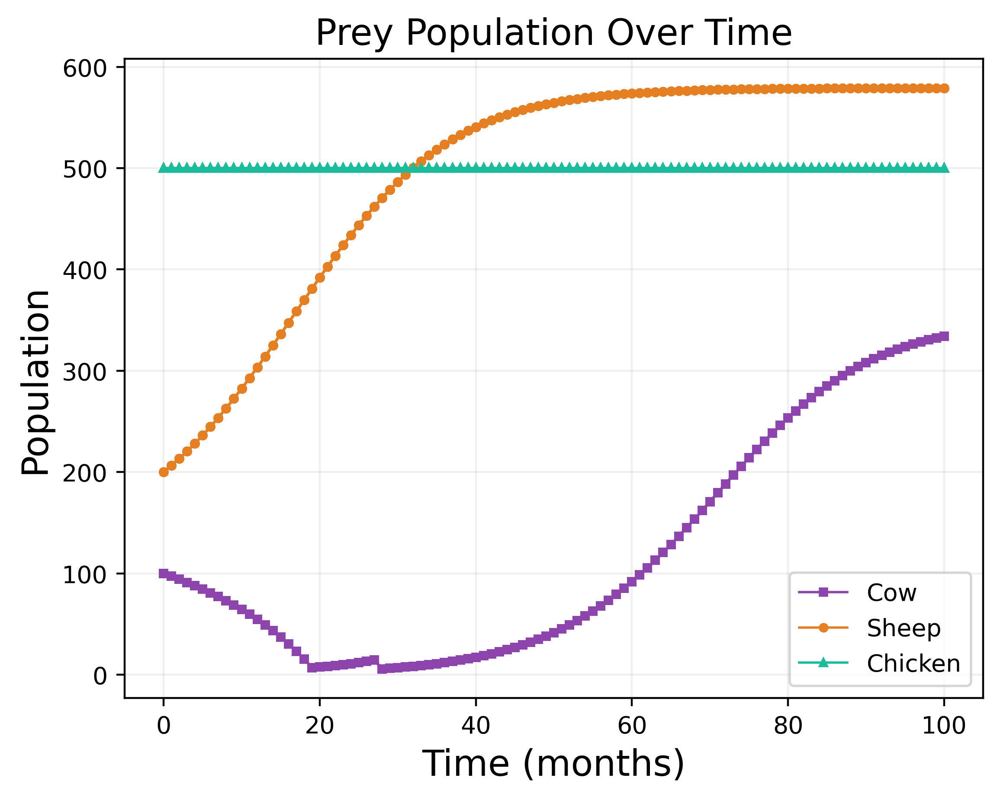

In [ ]:
# DETERMINISTIC

# Set-up for simulation

N_trials = 30         # Number of simulation trials
N_month = 101         # Number of months to track population

K = 2000              # Maximum weight for all dragons
T = 5000              # Weight below which the dragons will die
W0 = 10               # Initial weight (same for all dragons)
death_threshold = 10  # Weight below which the dragon will die

# Cow
initial_pop_cow = 100            # Initial cow population
growth_rate_cow = .10           # Average cow growth rate
growth_rate_cow_sd = .01        # Cow growth rate Standard deviation
kg_from_cow = 150               # Kg gained from eating cows
T_cow = 15                      # Cow population below which dragons lose 10% of its weight if it tries to hunt cows
cows_lost = 10                  # Cow population lost due to hunting
K_cow = 350                     # Maximum population for cows

# Sheep
initial_pop_sheep = 200         # Initial sheep population
growth_rate_sheep = .15         # Average sheep growth rate
growth_rate_sheep_sd = .05      # Sheep growth rate Standard deviation
kg_from_sheep = 90              # Kg gained from eating sheep
T_sheep = 50                    # Sheep population below which dragons lose 10% of its weight if it tries to hunt sheep
sheep_lost = 15                 # Sheep population lost due to hunting
K_sheep = 700                   # Maximum population for sheep

# Chickens
initial_pop_chick = 500         # Initial chicken population
growth_rate_chick = .30         # Average chicken growth rate
growth_rate_chick_sd = .10      # Chicken growth rate Standard deviation
kg_from_chick = 30              # Kg gained from eating chickens
T_chick = 100                   # Chicken population below which dragons lose 10% of its weight if it tries to hunt chickens
chickens_lost = 75              # Chicken population lost due to hunting
K_chick = 1000                  # Maximum population for chickens

# Initialize three empty DataFrames to store the results of all trials for each dragon
df_A = pd.DataFrame()
df_B = pd.DataFrame()
df_C = pd.DataFrame()

# Initialize three empty DataFrames to store the results of all trials for each prey
df_X = pd.DataFrame()
df_Y = pd.DataFrame()
df_Z = pd.DataFrame()

# Main loop for simulation
for i in range(N_trials):
    passed_threshold_A = False
    passed_threshold_B = False
    passed_threshold_C = False

    alive_A = True  # Dragon 1 is initially alive
    alive_B = True  # Dragon 2 is initially alive
    alive_C = True  # Dragon 3 is initially alive
    # Initialize vectors to record weight for each dragon
    A = np.zeros(N_month)
    B = np.zeros(N_month)
    C = np.zeros(N_month)

    # Initialize vectors to record population for each prey
    X = np.zeros(N_month)
    Y = np.zeros(N_month)
    Z = np.zeros(N_month)

    A[0] = W0  # Set initial weight
    B[0] = W0  # Set initial weight
    C[0] = W0  # Set initial weight

    X[0] = initial_pop_cow    # Set initial population size
    Y[0] = initial_pop_sheep  # Set initial population size
    Z[0] = initial_pop_chick  # Set initial population size

    # Looping over months
    for j in range(1, N_month):

        # Dem Stoch
        # Get stochastic growth rate for prey
        x = growth_rate_cow
        y = growth_rate_sheep
        z = growth_rate_chick

        # Cow
        X[j] = X[j-1] + (1-X[j-1]/K_cow)*x*X[j-1]

        # Sheep
        Y[j] = Y[j-1] + (1-Y[j-1]/K_sheep)*y*Y[j-1]

        # Chicken
        Z[j] = Z[j-1] + (1-Z[j-1]/K_chick)*z*Z[j-1]

        # Update weight growth rate based on ability to hunt
        # Dragon 1
        if alive_A and X[j] > T_cow:
          A[j] = A[j-1] + kg_from_cow
          X[j] -= cows_lost
        else:
          A[j] = A[j-1] - (0.30)*A[j-1]

        # Cap weight at K
        if A[j] > K:
            A[j] = K

        # Dragon 2
        if alive_B and Y[j] > T_sheep:
          B[j] = B[j-1] + kg_from_sheep
          Y[j] -= sheep_lost
        else:
          B[j] = B[j-1] - (0.20)*B[j-1]

        # Cap weight at K
        if B[j] > K:
            B[j] = K

        # Dragon 3
        if alive_C and Z[j] > T_chick:
          C[j] = C[j-1] + kg_from_chick
          Z[j] -= chickens_lost
        else:
          C[j] = C[j-1] - (0.10)*C[j-1]

        # Cap weight at K
        if C[j] > K:
            C[j] = K

        # Carrying capacity for prey
        if X[j] > K_cow:
            X[j] = K_cow

        if Y[j] > K_sheep:
            Y[j] = K_sheep

        if Z[j] > K_chick:
            Z[j] = K_chick

        # Once dragons pass the death threshold, they are eligible to die
        if A[j] > death_threshold:
            passed_threshold_A = True

        if B[j] > death_threshold:
            passed_threshold_B = True

        if C[j] > death_threshold:
            passed_threshold_C = True

        # Check if Dragon 1 dies
        if alive_A and passed_threshold_A:
            if A[j] < death_threshold:
                A[j] = 0  # Dragon dies, set weight to 0
                alive_A = False
                print(f"Trial {i+1}: Dragon 1 dies at time step {j}")

        # Check if Dragon 2 dies
        if alive_B and passed_threshold_B:
            if B[j] < death_threshold:
                B[j] = 0  # Dragon dies, set weight to 0
                alive_B = False
                print(f"Trial {i+1}: Dragon 2 dies at time step {j}")

        # Check if Dragon 3 dies
        if alive_C and passed_threshold_C:
            if C[j] < death_threshold:
                C[j] = 0  # Dragon dies, set weight to 0
                alive_C = False
                print(f"Trial {i+1}: Dragon 3 dies at time step {j}")

    # Augment the result of a trial to the DataFrame
    temp_A = pd.DataFrame(A, columns=[f"Trial {i+1}"])
    df_A = pd.concat([df_A, temp_A], axis=1)

    temp_B = pd.DataFrame(B, columns=[f"Trial {i+1}"])
    df_B = pd.concat([df_B, temp_B], axis=1)

    temp_C = pd.DataFrame(C, columns=[f"Trial {i+1}"])
    df_C = pd.concat([df_C, temp_C], axis=1)

    temp_X = pd.DataFrame(X, columns=[f"Trial {i+1}"])
    df_X = pd.concat([df_X, temp_X], axis=1)

    temp_Y = pd.DataFrame(Y, columns=[f"Trial {i+1}"])
    df_Y = pd.concat([df_Y, temp_Y], axis=1)

    temp_Z = pd.DataFrame(Z, columns=[f"Trial {i+1}"])
    df_Z = pd.concat([df_Z, temp_Z], axis=1)

# Plot I: Plot random trajectories over time for Dragon Weight
fig, ax = plt.subplots(1, 1, dpi=400)

for i in range(N_trials):
    ax.plot(df_A[f"Trial {i+1}"], "-s", linewidth=1, markersize=3, label = 'Dragon 1', color='r')
    ax.plot(df_B[f"Trial {i+1}"], "-o", linewidth=1, markersize=3, label = 'Dragon 2', color='b')
    ax.plot(df_C[f"Trial {i+1}"], "-^", linewidth=1, markersize=3, label = 'Dragon 3',color='g')

ax.set_xlabel("Time (months)", fontsize=15)
ax.set_ylabel("Weight (kg)", fontsize=15)
plt.legend(['Dragon 1', 'Dragon 2', 'Dragon 3'])
plt.grid(visible=True, alpha=0.2)
plt.title("Dragon Weight Over Time", fontsize=15)
plt.show()

# Plot II: Plot random trajectories over time for Prey Population
fig, ax = plt.subplots(1, 1, dpi=400)

for i in range(N_trials):
    ax.plot(df_X[f"Trial {i+1}"], "-s", linewidth=1, markersize=3, label = 'Cow', color='#8E44AD')
    ax.plot(df_Y[f"Trial {i+1}"], "-o", linewidth=1, markersize=3, label = 'Sheep', color='#E67E22')
    ax.plot(df_Z[f"Trial {i+1}"], "-^", linewidth=1, markersize=3, label = 'Chicken', color='#1ABC9C')

ax.set_xlabel("Time (months)", fontsize=15)
ax.set_ylabel("Population", fontsize=15)
plt.legend(['Cow', 'Sheep', 'Chicken'])
plt.grid(visible=True, alpha=0.2)
plt.title("Prey Population Over Time", fontsize=15)
plt.show()